# Data Mining Project - WNBA Playoffs prediction

### Project developed by:
- Adam Nogueira (up202007519)
- Eduardo Silva (up202004999)
- João Félix (up202008867)

## Table of Contents



### Introduction
This project involves developing a data mining case study, which is described in a separate document provided on Moodle. The main focus of the project is a predictive data mining task, the details of which are outlined in the case study description.

### Bibliography
NumPy Developers, Numpy documentation, URL: https://numpy.org/doc/stable/user/index.html#user <br>
pandas development team, pandas documentation, URL: https://pandas.pydata.org/docs/user_guide/index.html#user-guide<br>
Matplotlib Development team, Matplotlib documentation, URL: https://matplotlib.org/stable/index.html <br>
scikit-learn developers, scikit-learn documentation, URL: https://scikit-learn.org/0.18/documentation.html<br>

### Approach

The approach to this project was done as follows:

1. **Data analysis**: First we analyzed the dataset to inspect for the need for data pre-processing: checked the corresponding histograms, class distribution, and the existence of missing or null values.
2. **Algorithm implementation**: Flowing that, we defined the training and test sets using train/test split, resampled the dataset, and applied the SciKit Learn's algorithms to obtain the first results.
3. **Evaluation and refinement**: After analyzing the first results, tunning of each algorithm was done utilizing the SciKit Learn GridSearchCV to find the parameters of each algorithm that yielded the best overall results, and evaluated the final results.

### Used Libraries

- **NumPy**: Provides a fast numerical array structure and helper functions.
- **pandas**: Provides a DataFrame structure to store data in memory and work with it easily and efficiently.
- **matplotlib**: The essential Machine Learning package in Python.
- **sklearn**: Basic plotting library in Python; most other Python plotting libraries are built on top of it.
- **seaborn**: Advanced statistical plotting library.
- **pycaret**: Offers streamlined workflows and a wide range of pre-built algorithms and techniques to experiment with different models and compare their performance using different evaluation metrics.


## Data analysis

We start by importing the required libraries and plotting some graphs for initial analysis of the dataset.

### Key Statistics

- Win-Loss Record: This is the most straightforward indicator. Teams with more wins are more likely to make the Playoff prediction predictions. Historically, teams with around a .500 or better win-loss record tend to have a good chance of making the playoffs.

- Winning Percentage: Similar to win-loss record, winning percentage (Wins / Total Games) is a fundamental metric used to assess a team's performance.

- Points Per Game (PPG): Teams that score more points on average are often more successful. This statistic reflects a team's offensive efficiency.

- Points Allowed Per Game (PAPG): Teams that allow fewer points per game have a stronger defense. Defensive efficiency is a critical factor in determining playoff success.

- Net Rating: Net rating is the difference between a team's offensive rating (points scored per 100 possessions) and their defensive rating (points allowed per 100 possessions). Teams with positive net ratings are often playoff-bound.

- Field Goal Percentage (FG%): Shooting efficiency is a key factor in a team's offensive performance. A high field goal percentage indicates effective shooting.

- Three-Point Percentage (3P%): The ability to make three-point shots is crucial in modern basketball. Teams with high three-point percentages often perform well.

- Free Throw Percentage (FT%): Teams with good free throw shooting can close out close games more effectively.

- Rebounds Per Game (RPG): Rebounding is a key component of both offense and defense. Teams that dominate the boards tend to have an advantage.

- Assists Per Game (APG): Ball movement and sharing are critical in the NBA. Teams with high assist numbers often have a strong offense.

- Steals and Blocks: Defensive statistics such as steals and blocks indicate a team's ability to disrupt the opponent's offense and protect the rim.

- Turnovers: Reducing turnovers is important for maintaining possession and minimizing scoring opportunities for the opposition.


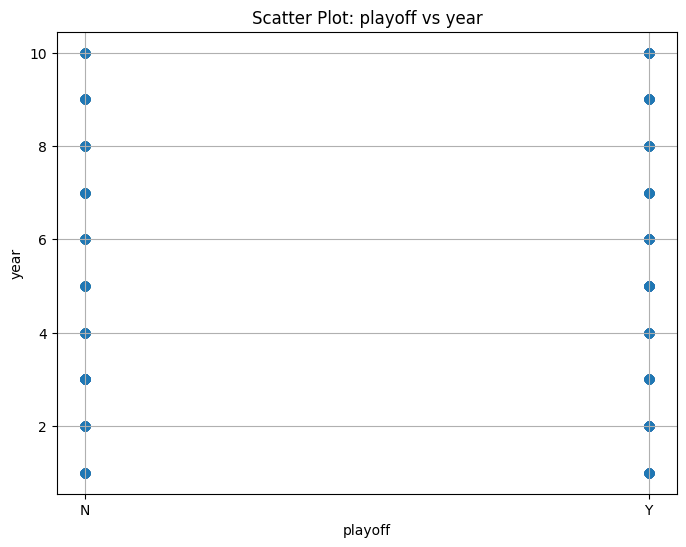

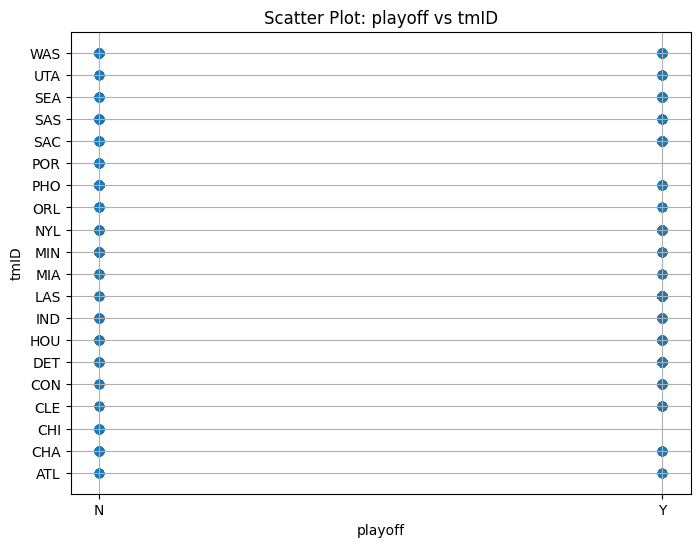

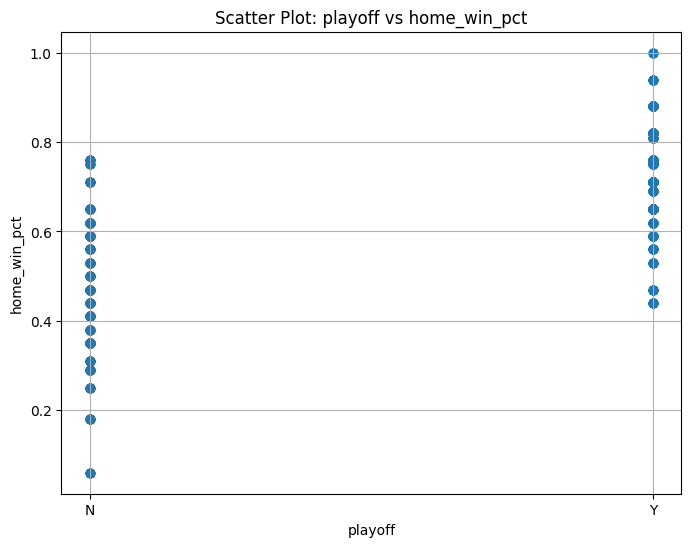

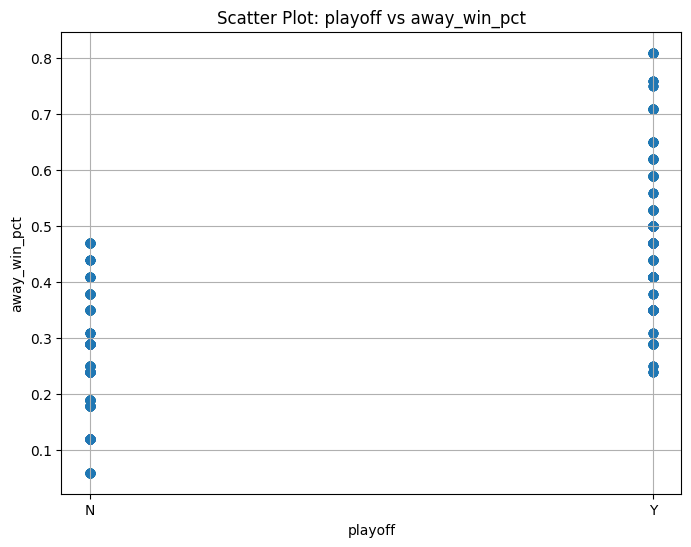

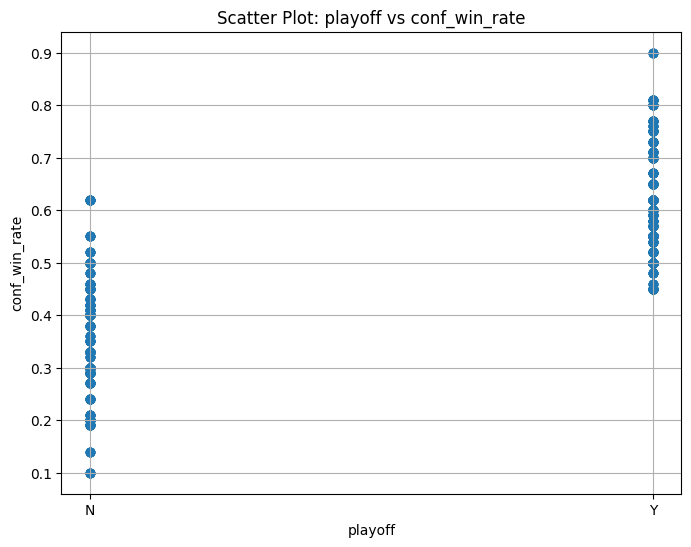

...

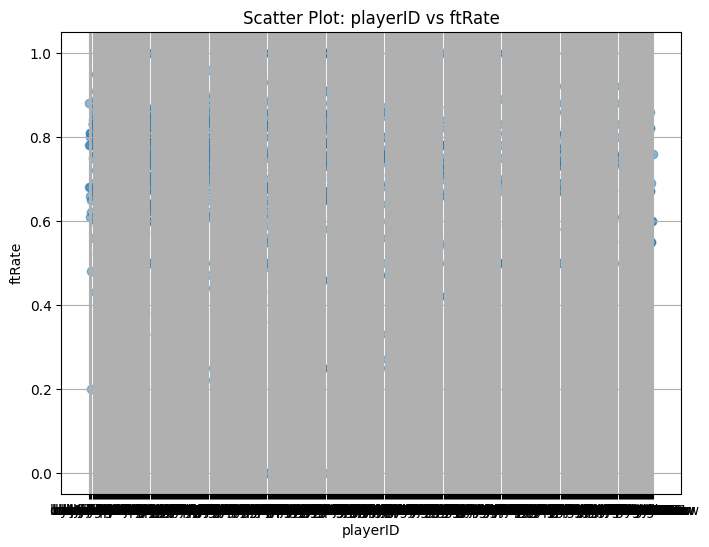

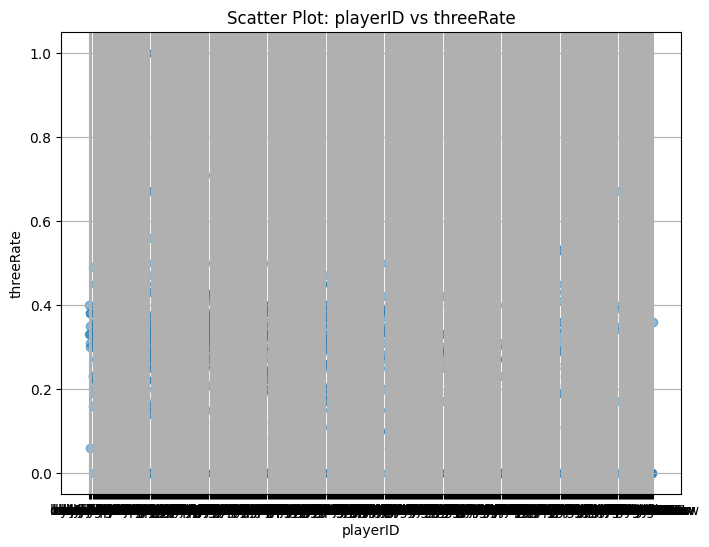

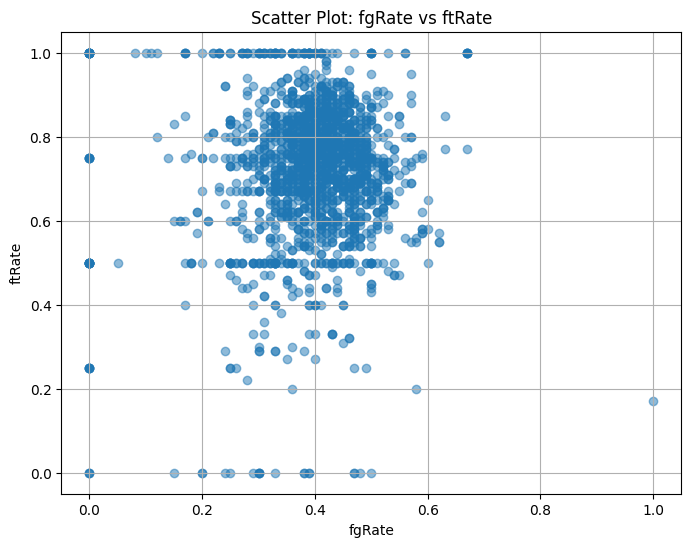

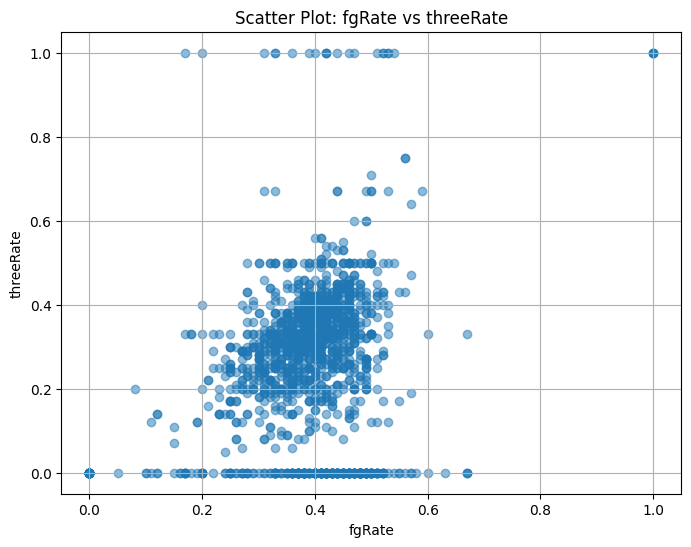

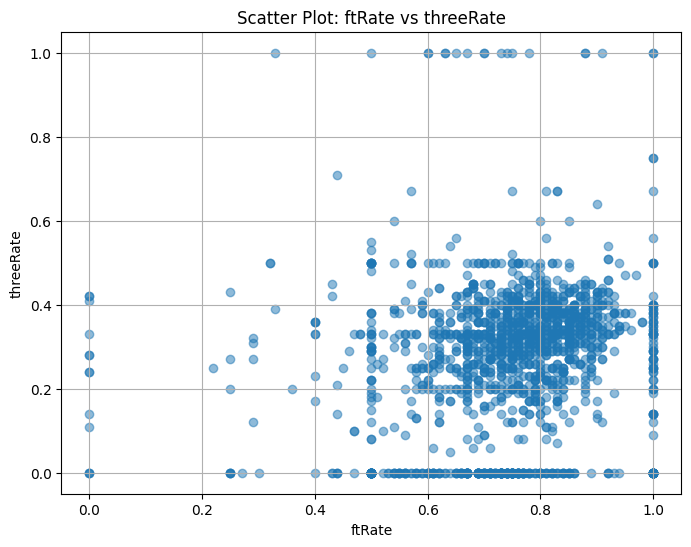

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from the CSV file
file_path = 'combined_data.csv'
df = pd.read_csv(file_path)

# Get the list of columns
columns = df.columns

# Create scatter plots for every pair of columns
for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        plt.figure(figsize=(8, 6))
        plt.scatter(df[columns[i]], df[columns[j]], alpha=0.5)
        plt.title(f'Scatter Plot: {columns[i]} vs {columns[j]}')
        plt.xlabel(columns[i])
        plt.ylabel(columns[j])
        plt.grid(True)
        plt.show()


### Dataset Preparation

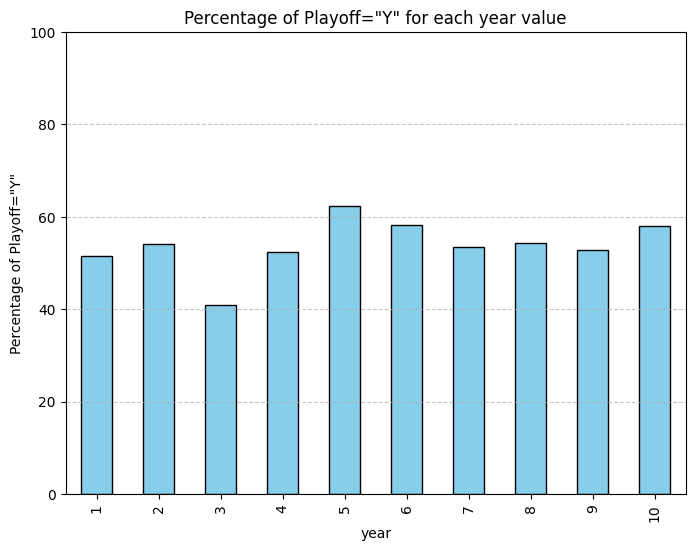

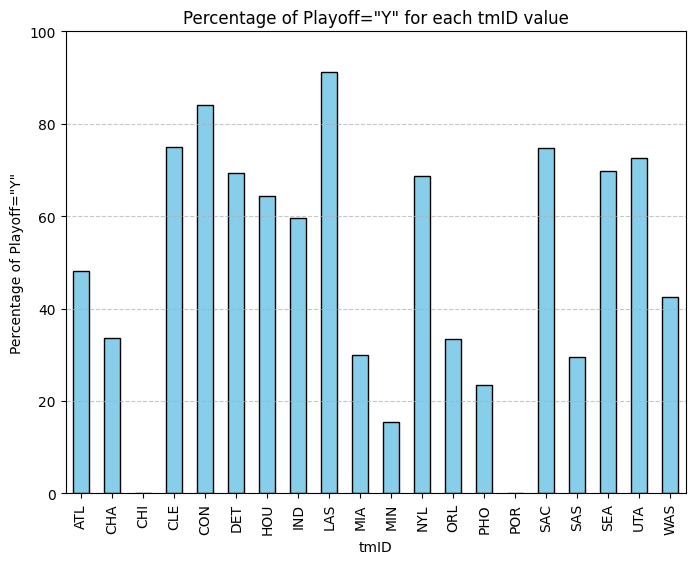

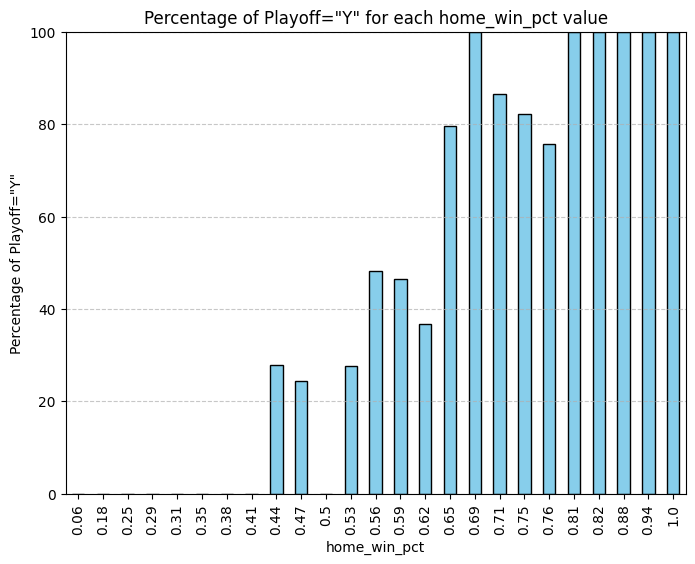

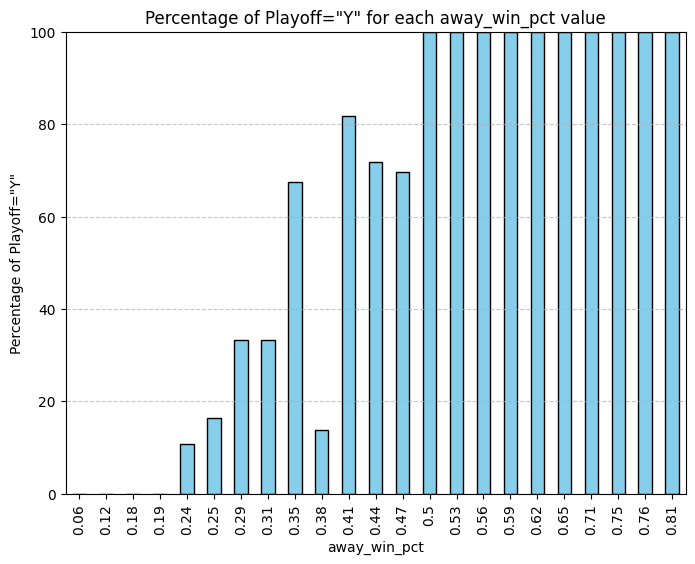

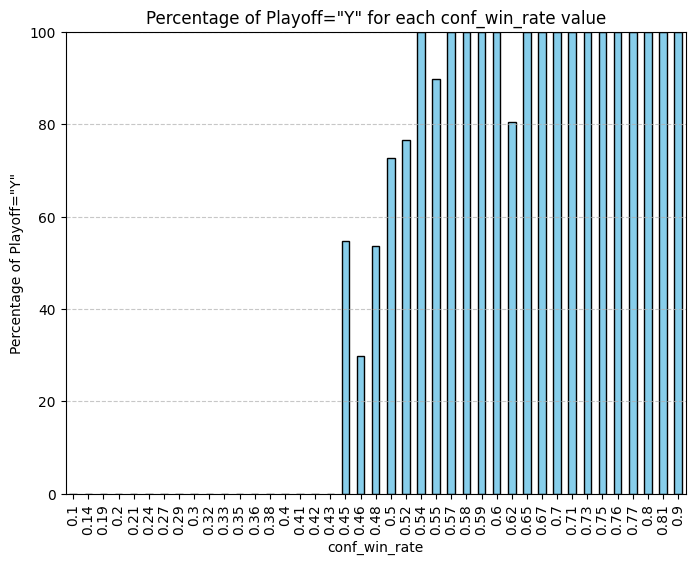

...

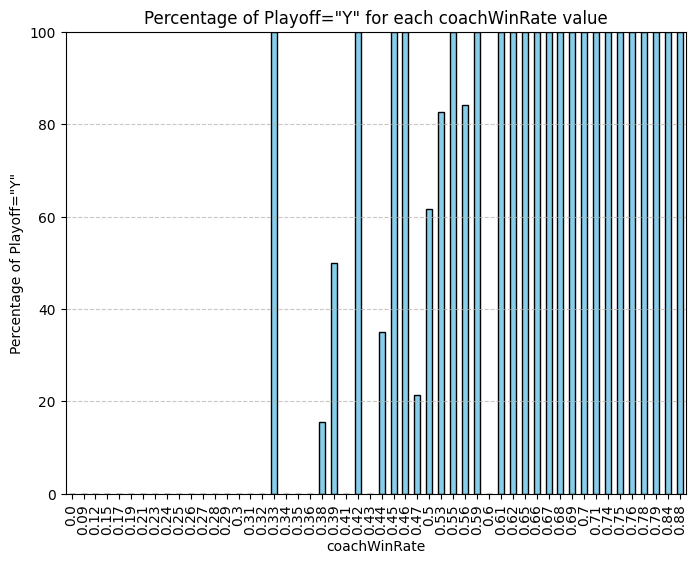

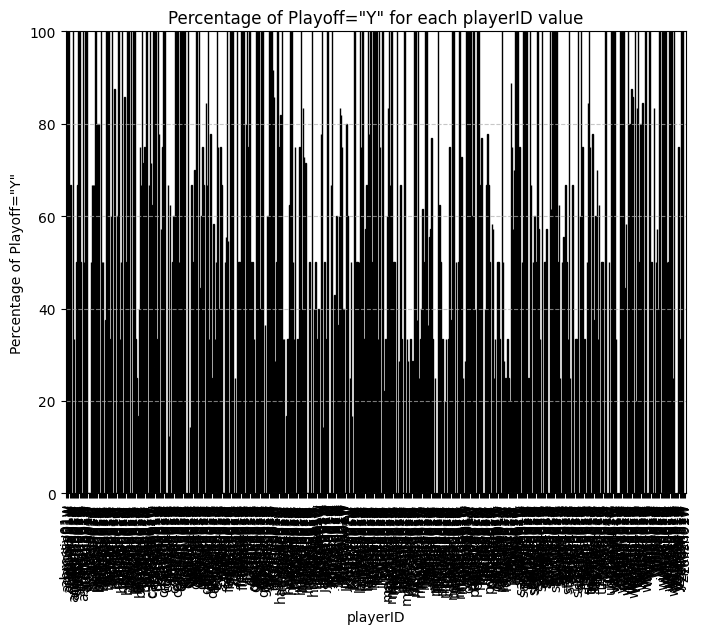

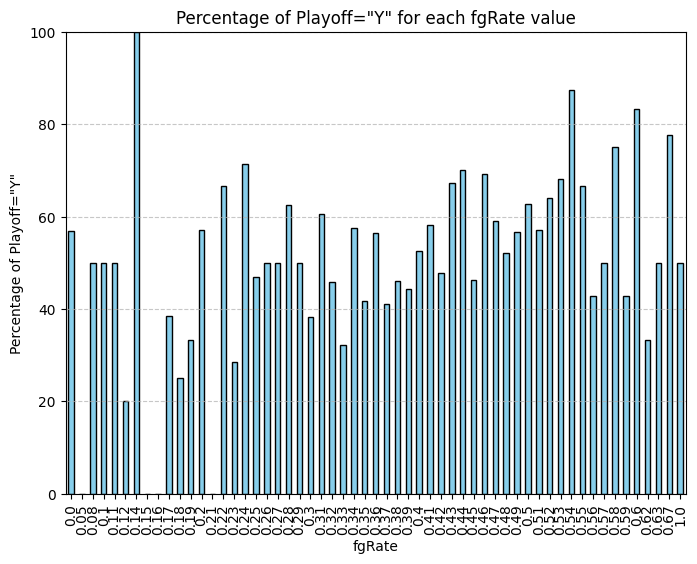

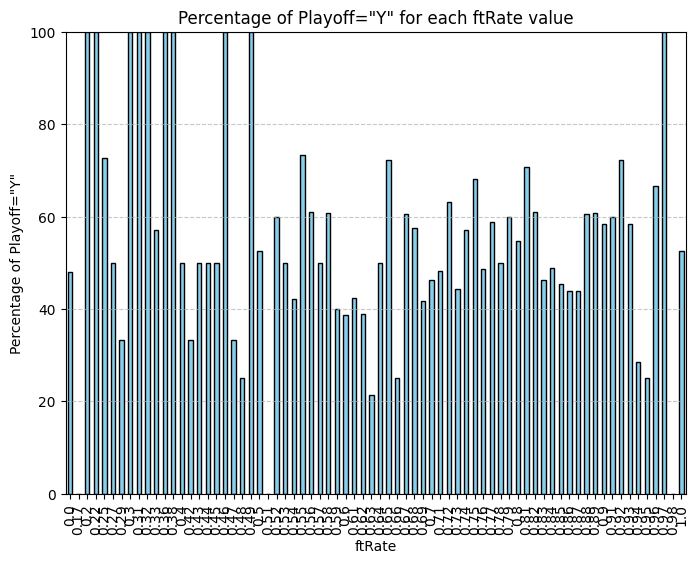

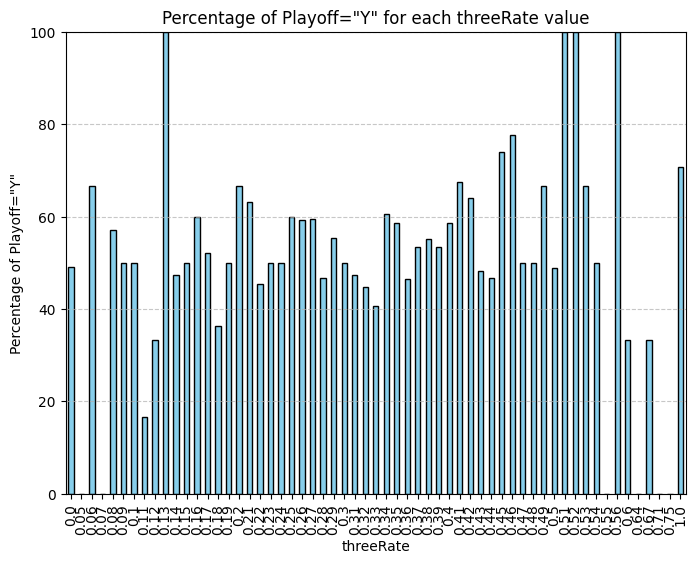

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data from the CSV file
file_path = 'combined_data.csv'
df = pd.read_csv(file_path)

# Get the list of columns (excluding the 'playoff' column)
columns = df.columns[df.columns != 'playoff']

# Create bar plots for every column showing the percentage of 'playoff'='Y'
for column in columns:
    plt.figure(figsize=(8, 6))
    
    # Calculate the percentage of 'playoff'='Y' for each unique value in the column
    percentages = df.groupby(column)['playoff'].value_counts(normalize=True).unstack().fillna(0)['Y'] * 100
    
    percentages.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Percentage of Playoff="Y" for each {column} value')
    plt.xlabel(column)
    plt.ylabel('Percentage of Playoff="Y"')
    plt.ylim(0, 100)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


### Dataset

In [ ]:
dataset = pd.read_csv('modified_data/teams.csv')

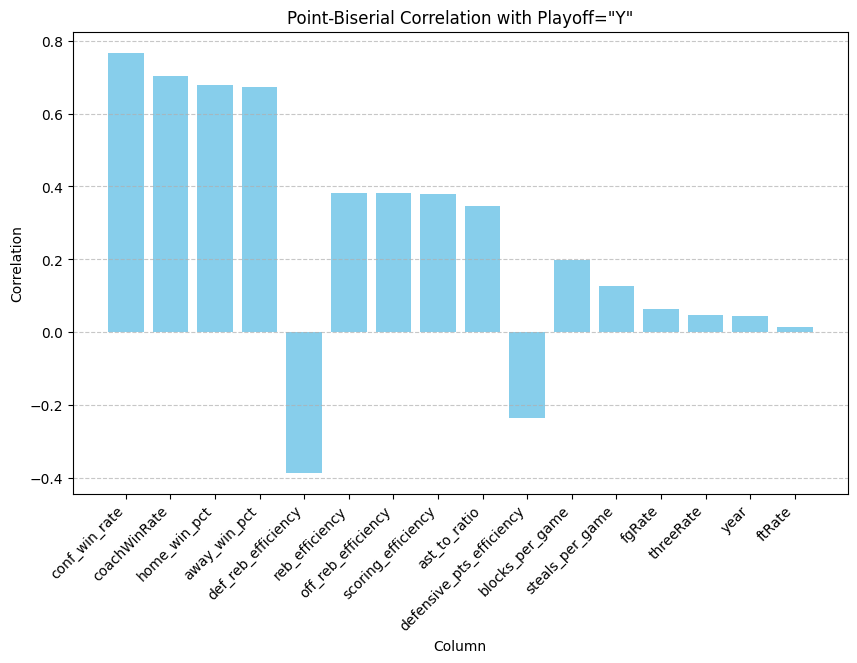

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pointbiserialr

# Load the data from the CSV file
file_path = 'combined_data.csv'
df = pd.read_csv(file_path)

# Get numeric columns (excluding the 'playoff' column)
numeric_columns = df.select_dtypes(include='number').columns

# Calculate point-biserial correlation for each numeric column
correlations = {}
for column in numeric_columns:
    # Drop rows with NaN values in both the numeric column and 'playoff' column
    non_nan_mask = ~df[[column, 'playoff']].isna().any(axis=1)
    correlation, _ = pointbiserialr(df.loc[non_nan_mask, column], (df.loc[non_nan_mask, 'playoff'] == 'Y').astype(int))
    correlations[column] = correlation

# Sort columns based on correlation
sorted_columns = sorted(correlations, key=lambda k: abs(correlations[k]), reverse=True)

# Plot bar chart of correlations
plt.figure(figsize=(10, 6))
plt.bar(sorted_columns, [correlations[col] for col in sorted_columns], color='skyblue')

plt.title('Point-Biserial Correlation with Playoff="Y"')
plt.xlabel('Column')
plt.ylabel('Correlation')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()




#### Checking for null values

In [15]:
import pandas as pd

# Load the CSV file into a pandas DataFrame
file_path = 'original_data/players.csv'
df = pd.read_csv(file_path)

# Exclude specified columns
exclude_columns = ["college","pos", "collegeOther", "deathDate", "firstseason", "lastseason"]
df = df.drop(columns=exclude_columns, errors='ignore')

# Define the values to check for (empty, 0, and '00-00-0000')
values_to_check = ['', 0, '00-00-0000']

# Count the number of rows with specified values in any column
filtered_rows = df.apply(lambda row: any(val in row.values for val in values_to_check), axis=1)
count_filtered_rows = filtered_rows.sum()

# Print the result
print(f"Number of rows with empty, 0, or '00-00-0000' values excluding specified columns: {count_filtered_rows}")




Number of rows with empty, 0, or '00-00-0000' values excluding specified columns: 119
